In [156]:
# General Packages
import pandas as pd
import numpy as np
from scipy.interpolate import make_interp_spline
import seaborn as sns
from datetime import date
import datetime
import missingno as msno
import os
import pickle
from tqdm import tqdm
import dataframe_image as dfi
import warnings
from matplotlib import animation
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
import ipywidgets as widgets

# PDF Packages
from reportlab.pdfgen.canvas import Canvas
from reportlab.lib import colors
from reportlab.lib.colors import red
from reportlab.lib.colors import black
from reportlab.lib.units import inch
from PyPDF2 import PdfMerger

# Modeling Packages
import xgboost as xg
from sklearn.metrics import mean_squared_error

# My Packages
import cfbd_api_updater

# Package Options
pd.set_option('display.max_columns',200)
pd.set_option('display.max_rows',1000)
warnings.filterwarnings("ignore")
%matplotlib inline

In [140]:
tackles_df = pd.read_csv('../data/raw/kaggle/tackles.csv')

tackle_sums = tackles_df[['nflId','tackle','assist','forcedFumble','pff_missedTackle']].groupby(['nflId']).sum().reset_index()

players_df = pd.read_csv('../data/raw/kaggle/players.csv')

tackle_sums = tackle_sums.merge(players_df[['displayName','position','nflId']],
                                how='left',
                                on='nflId')
tackle_sums = tackle_sums[['displayName','nflId','position','tackle','assist','forcedFumble','pff_missedTackle']]

In [141]:
# Pred Values
final_pred_df = pd.DataFrame()

pbar = tqdm(total=len(range(1,10)))
for i in range(1,10):
    pred_df = pd.read_csv(f'../data/processed/algo_output_data_week_{i}.csv')
    pred_df = pred_df[['nflId','club','playId','p(Tackle)','p(Assist)','p(Forced Fumble)','p(Missed Tackle)']]
    pred_df = pred_df.dropna().reset_index().drop('index',axis=1)
    
    final_pred_df = pd.concat([final_pred_df,pred_df]).reset_index().drop('index',axis=1)
    
    pbar.update(1)
pbar.close()

final_pred_df

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:32<00:00,  3.66s/it]


,nflId,club,playId,p(Tackle),p(Assist),p(Forced Fumble),p(Missed Tackle)
0,38577.0,LA,56,0.426023,0.380119,0.024427,0.503343
1,38577.0,LA,56,0.484335,0.372283,0.024427,0.419986
2,38577.0,LA,56,0.472903,0.336009,0.024427,0.371690
3,38577.0,LA,56,0.443330,0.319063,0.024427,0.367084
4,38577.0,LA,56,0.372961,0.268974,0.024427,0.348558
...,...,...,...,...,...,...,...
5828664,54606.0,BAL,3787,0.148455,0.109935,0.046169,0.160941
5828665,54606.0,BAL,3787,0.184128,0.126022,0.046169,0.160941
5828666,54606.0,BAL,3787,0.174947,0.127670,0.046169,0.167729
5828667,54606.0,BAL,3787,0.173175,0.127670,0.046169,0.144649


In [93]:
# Re-instituting a frame field
plyr_id = final_pred_df['nflId'].iat[0]
play_id = final_pred_df['playId'].iat[0]
frame_id =1

pbar = tqdm(total=len(final_pred_df))
for idx,row in final_pred_df.iterrows():
    if row['playId'] == play_id:
        # same play
        if row['nflId'] == plyr_id:
            # same player
            final_pred_df.at[idx,'frame_id'] = frame_id
            frame_id = frame_id + 1
            
            pbar.update(1)
            
        else:
            # new player
            plyr_id = row['nflId']
            frame_id = 1
            final_pred_df.at[idx,'frame_id'] = frame_id
            frame_id = frame_id + 1
            
            pbar.update(1)
            
    else:
        # new play
        play_id = row['playId']
        frame_id = 1
        final_pred_df.at[idx,'frame_id'] = frame_id
        frame_id = frame_id + 1
        
        pbar.update(1)
        
pbar.close()

final_pred_df.head(50)

100%|█████████████████████████████████████████████████████████████████████| 5828669/5828669 [08:27<00:00, 11490.40it/s]


,nflId,club,playId,p(Tackle),p(Assist),p(Forced Fumble),p(Missed Tackle),frame_id
0,38577.0,LA,56,0.426023,0.380119,0.024427,0.503343,1.0
1,38577.0,LA,56,0.484335,0.372283,0.024427,0.419986,2.0
2,38577.0,LA,56,0.472903,0.336009,0.024427,0.371690,3.0
3,38577.0,LA,56,0.443330,0.319063,0.024427,0.367084,4.0
4,38577.0,LA,56,0.372961,0.268974,0.024427,0.348558,5.0
5,38577.0,LA,56,0.366379,0.258143,0.024427,0.408490,6.0
6,38577.0,LA,56,0.360934,0.292609,0.024427,0.408490,7.0
7,38577.0,LA,56,0.354460,0.284667,0.024427,0.441002,8.0
8,38577.0,LA,56,0.384194,0.291783,0.024427,0.434705,9.0
9,38577.0,LA,56,0.386843,0.292539,0.024427,0.434705,10.0


In [113]:
frame_df = final_pred_df[['playId','frame_id']].drop_duplicates(subset=['playId'],keep='last').reset_index().drop('index',axis=1)

pbar = tqdm(total=len(final_pred_df))
for idx,row in final_pred_df.iterrows():
    cut_frame_df = frame_df[frame_df['playId']==row['playId']].reset_index().drop('index',axis=1)
    
    final_pred_df.at[idx,'frames_from_end_of_play'] = cut_frame_df['frame_id'].iat[0] - row['frame_id']
    
    pbar.update(1)
pbar.close()

final_pred_df


  0%|                                                                                      | 0/5828669 [00:41<?, ?it/s]

  0%|▏                                                                      | 12081/5828669 [00:18<1:45:38, 917.63it/s]


  0%|▎                                                                      | 24145/5828669 [00:33<1:46:23, 909.28it/s]


  1%|▍                                                                      | 36152/5828669 [00:47<1:56:38, 827.65it/s]


  1%|▌                                                                      | 48204/5828669 [01:02<1:55:15, 835.89it/s]


  1%|▋                                                                      | 60674/5828669 [01:17<1:46:32, 902.33it/s]


  1%|▉                                                                      | 72946/5828669 [01:31<1:48:07, 887.19it/s]


  1%|█                                                                      | 84954/5828669 [01:46<2:00:18, 795.69it/s]


  2%|█▏                                                                     | 97059/5828669 [02:01<2:09:55, 735.22it/s]


  2%|█▎                                                                    | 109487/5828669 [02:16<1:52:44, 845.46it/s]


  2%|█▍                                                                    | 122603/5828669 [02:30<2:00:17, 790.57it/s]


  2%|█▋                                                                    | 135668/5828669 [02:45<1:53:44, 834.22it/s]


  3%|█▊                                                                    | 147836/5828669 [03:00<1:54:39, 825.76it/s]


  3%|█▉                                                                    | 160352/5828669 [03:15<1:43:44, 910.70it/s]


  3%|██                                                                    | 172309/5828669 [03:29<1:45:25, 894.26it/s]


  3%|██▏                                                                   | 184971/5828669 [03:44<1:40:46, 933.39it/s]


  3%|██▎                                                                   | 196878/5828669 [03:59<1:52:13, 836.39it/s]


  4%|██▍                                                                  | 210586/5828669 [04:14<1:26:42, 1079.93it/s]


  4%|██▋                                                                  | 224038/5828669 [04:29<1:30:33, 1031.49it/s]


  4%|██▊                                                                   | 237555/5828669 [04:44<1:34:10, 989.45it/s]


  4%|██▉                                                                  | 251053/5828669 [04:58<1:27:25, 1063.36it/s]


  5%|███▏                                                                  | 264486/5828669 [05:13<1:34:06, 985.44it/s]


  5%|███▎                                                                  | 277444/5828669 [05:28<1:46:00, 872.73it/s]


  5%|███▍                                                                 | 290932/5828669 [05:43<1:27:46, 1051.58it/s]


  5%|███▋                                                                  | 304444/5828669 [05:58<1:51:29, 825.81it/s]


  5%|███▊                                                                  | 317808/5828669 [06:12<1:43:12, 889.99it/s]


  6%|███▉                                                                  | 331122/5828669 [06:27<1:45:13, 870.72it/s]


  6%|████                                                                 | 344856/5828669 [06:42<1:29:39, 1019.39it/s]


  6%|████▎                                                                 | 357534/5828669 [06:57<1:48:43, 838.67it/s]


  6%|████▍                                                                 | 369719/5828669 [07:12<2:03:13, 738.31it/s]


  7%|████▌                                                                 | 381888/5828669 [07:27<1:43:50, 874.16it/s]


  7%|████▋                                                                | 394769/5828669 [07:41<1:29:06, 1016.34it/s]


  7%|████▉                                                                 | 408078/5828669 [07:56<1:47:19, 841.78it/s]


  7%|█████                                                                 | 421526/5828669 [08:11<1:35:18, 945.63it/s]


  7%|█████▏                                                                | 433449/5828669 [08:25<1:48:06, 831.78it/s]


  8%|█████▎                                                               | 447206/5828669 [08:40<1:26:05, 1041.76it/s]


  8%|█████▌                                                                | 460398/5828669 [08:55<1:49:24, 817.73it/s]


  8%|█████▋                                                                | 474102/5828669 [09:10<1:42:20, 872.06it/s]


  8%|█████▊                                                                | 487930/5828669 [09:25<1:47:11, 830.39it/s]


  9%|██████                                                                | 501665/5828669 [09:39<1:30:59, 975.80it/s]


  9%|██████▏                                                               | 514827/5828669 [09:54<1:43:22, 856.67it/s]


  9%|██████▎                                                               | 528317/5828669 [10:09<1:40:59, 874.72it/s]


  9%|██████▌                                                               | 541733/5828669 [10:24<1:37:21, 905.14it/s]


 10%|██████▋                                                               | 555396/5828669 [10:39<1:42:58, 853.43it/s]


 10%|██████▊                                                               | 569233/5828669 [10:53<1:28:49, 986.83it/s]


 10%|██████▉                                                               | 582747/5828669 [11:08<1:37:32, 896.35it/s]


 10%|███████▏                                                              | 596341/5828669 [11:23<1:33:02, 937.21it/s]


 10%|███████▎                                                              | 609729/5828669 [11:38<1:40:00, 869.74it/s]


 11%|███████▍                                                             | 623587/5828669 [11:53<1:21:08, 1069.16it/s]


 11%|███████▋                                                              | 636585/5828669 [12:08<1:42:55, 840.82it/s]


 11%|███████▋                                                             | 649899/5828669 [12:22<1:20:19, 1074.61it/s]


 11%|███████▉                                                              | 663412/5828669 [12:37<1:34:25, 911.66it/s]


 12%|████████▏                                                             | 676763/5828669 [12:52<1:44:38, 820.55it/s]


 12%|████████▏                                                            | 690636/5828669 [13:07<1:17:38, 1102.82it/s]


 12%|████████▍                                                             | 703723/5828669 [13:22<1:35:06, 898.15it/s]


 12%|████████▌                                                             | 717124/5828669 [13:37<1:34:12, 904.26it/s]


 13%|████████▊                                                             | 730282/5828669 [13:51<1:30:21, 940.32it/s]


 13%|████████▉                                                             | 743510/5828669 [14:06<1:31:52, 922.43it/s]


 13%|█████████                                                             | 756961/5828669 [14:21<1:29:21, 945.93it/s]


 13%|█████████▏                                                            | 770013/5828669 [14:36<1:34:59, 887.52it/s]


 13%|█████████▍                                                            | 783609/5828669 [14:51<1:37:36, 861.49it/s]


 14%|█████████▌                                                            | 796759/5828669 [15:06<2:00:07, 698.13it/s]


 14%|█████████▋                                                            | 809557/5828669 [15:20<1:51:09, 752.59it/s]


 14%|█████████▊                                                            | 821689/5828669 [15:35<1:39:07, 841.93it/s]


 14%|██████████                                                            | 834022/5828669 [15:50<1:37:42, 851.92it/s]


 15%|██████████▏                                                           | 846188/5828669 [16:04<1:39:15, 836.58it/s]


 15%|██████████▎                                                           | 858315/5828669 [16:19<1:35:50, 864.33it/s]


 15%|██████████▍                                                           | 870376/5828669 [16:34<1:46:33, 775.47it/s]


 15%|██████████▌                                                           | 882750/5828669 [16:49<2:10:19, 632.50it/s]


 15%|██████████▌                                                          | 894860/5828669 [17:03<1:21:43, 1006.11it/s]


 16%|██████████▉                                                           | 907862/5828669 [17:18<1:40:18, 817.61it/s]


 16%|██████████▉                                                          | 921105/5828669 [17:33<1:20:46, 1012.63it/s]


 16%|███████████▏                                                          | 934555/5828669 [17:47<1:26:35, 941.92it/s]


 16%|███████████▍                                                          | 947793/5828669 [18:02<1:24:59, 957.22it/s]


 16%|███████████▌                                                          | 960173/5828669 [18:17<2:00:10, 675.24it/s]


 17%|███████████▋                                                          | 972711/5828669 [18:32<1:41:00, 801.27it/s]


 17%|███████████▊                                                          | 984961/5828669 [18:47<1:26:03, 938.15it/s]


 17%|███████████▉                                                          | 996891/5828669 [19:02<1:45:23, 764.12it/s]


 17%|███████████▉                                                         | 1008979/5828669 [19:16<1:40:20, 800.49it/s]


 18%|████████████                                                         | 1022294/5828669 [19:31<1:28:02, 909.85it/s]


 18%|████████████                                                        | 1035972/5828669 [19:46<1:16:58, 1037.64it/s]


 18%|████████████▍                                                        | 1049146/5828669 [20:01<1:33:44, 849.69it/s]


 18%|████████████▌                                                        | 1062905/5828669 [20:16<1:22:30, 962.75it/s]


 18%|████████████▌                                                       | 1076350/5828669 [20:30<1:19:04, 1001.62it/s]


 19%|████████████▉                                                        | 1089302/5828669 [20:45<1:23:38, 944.40it/s]


 19%|████████████▊                                                       | 1102687/5828669 [21:00<1:08:03, 1157.30it/s]


 19%|█████████████▏                                                       | 1116351/5828669 [21:15<1:26:58, 902.95it/s]


 19%|█████████████▍                                                       | 1130308/5828669 [21:30<1:25:04, 920.36it/s]


 20%|█████████████▌                                                       | 1143872/5828669 [21:45<1:21:15, 960.88it/s]


 20%|█████████████▋                                                       | 1157043/5828669 [21:59<1:29:16, 872.11it/s]


 20%|█████████████▊                                                       | 1170415/5828669 [22:14<1:26:39, 895.95it/s]


 20%|██████████████                                                       | 1183999/5828669 [22:29<1:19:22, 975.18it/s]


 21%|██████████████▏                                                      | 1197641/5828669 [22:44<1:22:11, 939.02it/s]


 21%|██████████████▎                                                      | 1210811/5828669 [22:59<1:31:09, 844.24it/s]


 21%|██████████████▍                                                      | 1224634/5828669 [23:14<1:26:31, 886.87it/s]


 21%|██████████████▍                                                     | 1238474/5828669 [23:28<1:05:10, 1173.81it/s]


 21%|██████████████▊                                                      | 1251661/5828669 [23:43<1:39:10, 769.18it/s]


 22%|██████████████▉                                                      | 1263725/5828669 [23:58<1:27:28, 869.74it/s]


 22%|███████████████                                                      | 1276477/5828669 [24:13<1:17:18, 981.49it/s]


 22%|███████████████▎                                                     | 1288719/5828669 [24:28<1:18:08, 968.37it/s]


 22%|███████████████▏                                                    | 1302246/5828669 [24:42<1:11:29, 1055.13it/s]


 23%|███████████████▌                                                     | 1315627/5828669 [24:57<1:18:30, 958.10it/s]


 23%|███████████████▋                                                     | 1328594/5828669 [25:12<1:22:39, 907.36it/s]


 23%|███████████████▉                                                     | 1341980/5828669 [25:27<1:27:22, 855.86it/s]


 23%|████████████████                                                     | 1355093/5828669 [25:41<1:29:28, 833.35it/s]


 23%|████████████████▏                                                    | 1368557/5828669 [25:56<1:21:54, 907.58it/s]


 24%|████████████████                                                    | 1381719/5828669 [26:11<1:12:20, 1024.42it/s]


 24%|████████████████▌                                                    | 1395416/5828669 [26:25<1:25:08, 867.89it/s]


 24%|████████████████▋                                                    | 1408705/5828669 [26:40<1:15:19, 978.07it/s]


 24%|████████████████▊                                                    | 1422171/5828669 [26:55<1:20:07, 916.63it/s]


 25%|████████████████▉                                                    | 1435481/5828669 [27:10<1:33:56, 779.40it/s]


 25%|█████████████████▏                                                   | 1448815/5828669 [27:24<1:16:08, 958.61it/s]


 25%|█████████████████                                                   | 1462366/5828669 [27:39<1:11:46, 1013.88it/s]


 25%|█████████████████▍                                                   | 1475719/5828669 [27:54<1:25:06, 852.35it/s]


 26%|█████████████████▌                                                   | 1488811/5828669 [28:09<1:29:40, 806.66it/s]


 26%|█████████████████▊                                                   | 1500828/5828669 [28:23<1:28:48, 812.20it/s]


 26%|█████████████████▉                                                   | 1513067/5828669 [28:38<1:37:41, 736.29it/s]


 26%|██████████████████                                                   | 1524963/5828669 [28:53<1:27:45, 817.37it/s]


 26%|█████████████████▉                                                  | 1537469/5828669 [29:08<1:10:46, 1010.53it/s]


 27%|██████████████████▎                                                  | 1550032/5828669 [29:22<1:34:15, 756.52it/s]


 27%|██████████████████▍                                                  | 1561918/5828669 [29:37<1:24:33, 841.02it/s]


 27%|██████████████████▋                                                  | 1575671/5828669 [29:52<1:26:33, 818.88it/s]


 27%|██████████████████▊                                                  | 1589147/5828669 [30:07<1:23:58, 841.42it/s]


 27%|██████████████████▉                                                  | 1602302/5828669 [30:22<1:18:00, 902.93it/s]


 28%|███████████████████▏                                                 | 1615825/5828669 [30:37<1:20:56, 867.49it/s]


 28%|███████████████████▎                                                 | 1628887/5828669 [30:51<1:13:45, 948.95it/s]


 28%|███████████████████▍                                                 | 1642800/5828669 [31:06<1:14:22, 938.02it/s]


 28%|███████████████████▎                                                | 1655717/5828669 [31:21<1:08:13, 1019.46it/s]


 29%|███████████████████▊                                                 | 1669210/5828669 [31:35<1:10:14, 986.87it/s]


 29%|███████████████████▉                                                 | 1682676/5828669 [31:50<1:17:01, 897.07it/s]


 29%|████████████████████                                                 | 1696295/5828669 [32:05<1:10:36, 975.32it/s]


 29%|████████████████████▏                                                | 1709671/5828669 [32:20<1:16:34, 896.56it/s]


 30%|████████████████████▍                                                | 1723378/5828669 [32:35<1:21:30, 839.37it/s]


 30%|████████████████████▌                                                | 1737069/5828669 [32:49<1:15:28, 903.44it/s]


 30%|████████████████████▋                                                | 1750564/5828669 [33:04<1:18:23, 867.11it/s]


 30%|████████████████████▉                                                | 1764182/5828669 [33:19<1:21:30, 831.18it/s]


 30%|█████████████████████                                                | 1777000/5828669 [33:33<1:09:28, 972.03it/s]


 31%|█████████████████████▏                                               | 1790499/5828669 [33:48<1:24:56, 792.32it/s]


 31%|█████████████████████▎                                               | 1803730/5828669 [34:03<1:07:08, 999.02it/s]


 31%|█████████████████████▌                                               | 1817494/5828669 [34:17<1:24:43, 788.99it/s]


 31%|█████████████████████▋                                               | 1830574/5828669 [34:32<1:14:40, 892.31it/s]


 32%|█████████████████████▊                                               | 1844309/5828669 [34:47<1:13:04, 908.72it/s]


 32%|█████████████████████▉                                               | 1857932/5828669 [35:02<1:14:53, 883.60it/s]


 32%|██████████████████████▏                                              | 1871283/5828669 [35:17<1:18:44, 837.64it/s]


 32%|██████████████████████▎                                              | 1884231/5828669 [35:31<1:07:21, 976.04it/s]


 33%|██████████████████████▍                                              | 1897437/5828669 [35:46<1:16:27, 856.92it/s]


 33%|██████████████████████▌                                              | 1909726/5828669 [36:01<1:33:53, 695.69it/s]


 33%|██████████████████████▋                                              | 1921540/5828669 [36:15<1:20:42, 806.89it/s]


 33%|██████████████████████▉                                              | 1933739/5828669 [36:30<1:20:05, 810.49it/s]


 33%|███████████████████████                                              | 1946866/5828669 [36:45<1:05:57, 980.79it/s]


 34%|███████████████████████▏                                             | 1960013/5828669 [36:59<1:17:19, 833.83it/s]


 34%|███████████████████████▎                                             | 1973558/5828669 [37:14<1:21:38, 787.03it/s]


 34%|███████████████████████▌                                             | 1986885/5828669 [37:29<1:10:54, 902.99it/s]


 34%|███████████████████████▋                                             | 2000134/5828669 [37:44<1:07:35, 943.96it/s]


 35%|████████████████████████▏                                             | 2013639/5828669 [37:59<58:46, 1081.93it/s]


 35%|███████████████████████▉                                             | 2026843/5828669 [38:14<1:05:38, 965.35it/s]


 35%|████████████████████████▏                                            | 2039683/5828669 [38:29<1:22:23, 766.49it/s]


 35%|████████████████████████▎                                            | 2053125/5828669 [38:43<1:21:26, 772.63it/s]


 35%|████████████████████████▍                                            | 2066627/5828669 [38:58<1:15:11, 833.93it/s]


 36%|████████████████████████▌                                            | 2079934/5828669 [39:13<1:10:03, 891.89it/s]


 36%|████████████████████████▊                                            | 2093163/5828669 [39:28<1:23:35, 744.82it/s]


 36%|████████████████████████▉                                            | 2105425/5828669 [39:42<1:11:39, 866.06it/s]


 36%|█████████████████████████                                            | 2117928/5828669 [39:57<1:26:10, 717.61it/s]


 37%|█████████████████████████▏                                           | 2130200/5828669 [40:12<1:28:35, 695.78it/s]


 37%|█████████████████████████▎                                           | 2142922/5828669 [40:27<1:05:14, 941.55it/s]


 37%|█████████████████████████▉                                            | 2156338/5828669 [40:41<55:43, 1098.28it/s]


 37%|█████████████████████████▋                                           | 2169966/5828669 [40:56<1:04:24, 946.78it/s]


 37%|█████████████████████████▊                                           | 2183645/5828669 [41:11<1:04:26, 942.60it/s]


 38%|██████████████████████████                                           | 2197603/5828669 [41:25<1:06:55, 904.15it/s]


 38%|██████████████████████████▌                                           | 2210769/5828669 [41:40<57:11, 1054.37it/s]


 38%|██████████████████████████▎                                          | 2224144/5828669 [41:55<1:12:51, 824.52it/s]


 38%|██████████████████████████▊                                           | 2237445/5828669 [42:10<59:27, 1006.76it/s]


 39%|██████████████████████████▋                                          | 2251148/5828669 [42:24<1:10:40, 843.56it/s]


 39%|██████████████████████████▊                                          | 2264483/5828669 [42:39<1:06:56, 887.36it/s]


 39%|██████████████████████████▉                                          | 2277977/5828669 [42:54<1:02:20, 949.36it/s]


 39%|███████████████████████████▌                                          | 2291548/5828669 [43:09<58:27, 1008.44it/s]


 40%|███████████████████████████▎                                         | 2304914/5828669 [43:24<1:03:52, 919.55it/s]


 40%|███████████████████████████▍                                         | 2318483/5828669 [43:38<1:05:40, 890.85it/s]


 40%|███████████████████████████▌                                         | 2331880/5828669 [43:53<1:09:02, 844.22it/s]


 40%|███████████████████████████▊                                         | 2345495/5828669 [44:08<1:03:42, 911.12it/s]


 40%|████████████████████████████▋                                          | 2359026/5828669 [44:23<59:36, 970.04it/s]


 41%|████████████████████████████▍                                         | 2372402/5828669 [44:38<55:55, 1029.89it/s]


 41%|█████████████████████████████                                          | 2386254/5828669 [44:52<57:33, 996.78it/s]


 41%|█████████████████████████████▏                                         | 2399508/5828669 [45:07<57:42, 990.27it/s]


 41%|████████████████████████████▌                                        | 2412136/5828669 [45:22<1:10:00, 813.31it/s]


 42%|████████████████████████████▋                                        | 2424360/5828669 [45:37<1:35:36, 593.46it/s]


 42%|█████████████████████████████▋                                         | 2437129/5828669 [45:52<57:52, 976.64it/s]


 42%|█████████████████████████████▍                                        | 2450326/5828669 [46:06<54:08, 1040.09it/s]


 42%|█████████████████████████████▌                                        | 2462992/5828669 [46:21<47:44, 1174.83it/s]


 42%|█████████████████████████████▎                                       | 2475483/5828669 [46:36<1:14:48, 747.14it/s]


 43%|█████████████████████████████▍                                       | 2487608/5828669 [46:51<1:05:00, 856.59it/s]


 43%|██████████████████████████████▍                                        | 2500424/5828669 [47:05<58:51, 942.37it/s]


 43%|█████████████████████████████▊                                       | 2513294/5828669 [47:20<1:05:03, 849.30it/s]


 43%|██████████████████████████████▎                                       | 2526739/5828669 [47:35<52:11, 1054.27it/s]


 44%|██████████████████████████████                                       | 2540528/5828669 [47:50<1:02:18, 879.58it/s]


 44%|███████████████████████████████                                        | 2552401/5828669 [48:05<56:52, 960.19it/s]


 44%|██████████████████████████████▎                                      | 2565034/5828669 [48:20<1:16:05, 714.92it/s]


 44%|███████████████████████████████▍                                       | 2577758/5828669 [48:35<55:13, 981.20it/s]


 44%|███████████████████████████████▌                                       | 2590386/5828669 [48:50<55:19, 975.59it/s]


 45%|██████████████████████████████▊                                      | 2602564/5828669 [49:04<1:01:35, 872.93it/s]


 45%|███████████████████████████████▊                                       | 2615166/5828669 [49:19<57:29, 931.60it/s]


 45%|███████████████████████████████▌                                      | 2628193/5828669 [49:34<51:38, 1032.75it/s]


 45%|████████████████████████████████▏                                      | 2640376/5828669 [49:49<58:02, 915.58it/s]


 46%|████████████████████████████████▎                                      | 2652480/5828669 [50:03<55:18, 957.22it/s]


 46%|████████████████████████████████▍                                      | 2665393/5828669 [50:18<56:40, 930.35it/s]


 46%|████████████████████████████████▌                                      | 2677604/5828669 [50:33<56:23, 931.42it/s]


 46%|████████████████████████████████▊                                      | 2690298/5828669 [50:48<58:42, 890.91it/s]


 46%|████████████████████████████████▉                                      | 2703616/5828669 [51:02<56:36, 920.06it/s]


 47%|████████████████████████████████▏                                    | 2715972/5828669 [51:17<1:19:04, 656.05it/s]


 47%|████████████████████████████████▎                                    | 2728452/5828669 [51:32<1:05:03, 794.25it/s]


 47%|█████████████████████████████████▍                                     | 2740860/5828669 [51:47<55:41, 924.05it/s]


 47%|█████████████████████████████████▌                                     | 2753016/5828669 [52:02<56:10, 912.61it/s]


 47%|█████████████████████████████████▋                                     | 2766646/5828669 [52:17<52:06, 979.24it/s]


 48%|████████████████████████████████▉                                    | 2780276/5828669 [52:31<1:04:51, 783.37it/s]


 48%|█████████████████████████████████▌                                    | 2793615/5828669 [52:46<48:56, 1033.56it/s]


 48%|██████████████████████████████████▏                                    | 2807349/5828669 [53:01<55:37, 905.38it/s]


 48%|█████████████████████████████████▉                                    | 2821067/5828669 [53:16<49:46, 1007.23it/s]


 49%|██████████████████████████████████▌                                    | 2834522/5828669 [53:30<54:07, 922.10it/s]


 49%|██████████████████████████████████▋                                    | 2848049/5828669 [53:45<49:56, 994.75it/s]


 49%|██████████████████████████████████▊                                    | 2861826/5828669 [54:00<54:39, 904.76it/s]


 49%|███████████████████████████████████                                    | 2875281/5828669 [54:15<50:07, 981.86it/s]


 50%|███████████████████████████████████▏                                   | 2888676/5828669 [54:29<51:23, 953.45it/s]


 50%|██████████████████████████████████▎                                  | 2901770/5828669 [54:44<1:02:30, 780.45it/s]


 50%|██████████████████████████████████▌                                  | 2915605/5828669 [54:59<1:00:41, 799.88it/s]


 50%|███████████████████████████████████▏                                  | 2928981/5828669 [55:14<47:30, 1017.37it/s]


 50%|███████████████████████████████████▊                                   | 2941985/5828669 [55:29<51:45, 929.60it/s]


 51%|███████████████████████████████████▉                                   | 2954566/5828669 [55:43<58:11, 823.09it/s]


 51%|███████████████████████████████████                                  | 2967011/5828669 [55:58<1:00:09, 792.91it/s]


 51%|███████████████████████████████████▎                                 | 2979629/5828669 [56:13<1:05:40, 723.05it/s]


 51%|███████████████████████████████████▍                                 | 2992110/5828669 [56:28<1:13:46, 640.80it/s]


 52%|███████████████████████████████████▌                                 | 3004182/5828669 [56:42<1:11:37, 657.21it/s]


 52%|████████████████████████████████████▏                                 | 3016632/5828669 [56:57<46:36, 1005.71it/s]


 52%|███████████████████████████████████▊                                 | 3029060/5828669 [57:12<1:00:47, 767.47it/s]


 52%|█████████████████████████████████████                                  | 3041860/5828669 [57:26<56:42, 819.09it/s]


 52%|████████████████████████████████████▏                                | 3053814/5828669 [57:41<1:02:16, 742.64it/s]


 53%|█████████████████████████████████████▎                                 | 3066172/5828669 [57:56<48:42, 945.16it/s]


 53%|█████████████████████████████████████▍                                 | 3078139/5828669 [58:11<52:34, 871.87it/s]


 53%|█████████████████████████████████████▋                                 | 3090944/5828669 [58:26<49:02, 930.52it/s]


 53%|█████████████████████████████████████▊                                 | 3103070/5828669 [58:40<48:11, 942.58it/s]


 53%|█████████████████████████████████████▉                                 | 3115549/5828669 [58:55<46:53, 964.35it/s]


 54%|██████████████████████████████████████                                 | 3127426/5828669 [59:10<50:10, 897.19it/s]


 54%|██████████████████████████████████████▎                                | 3140705/5828669 [59:24<52:18, 856.45it/s]


 54%|██████████████████████████████████████▍                                | 3153214/5828669 [59:39<47:36, 936.74it/s]


 54%|██████████████████████████████████████▌                                | 3164981/5828669 [59:54<45:37, 973.21it/s]


 55%|█████████████████████████████████████▌                               | 3177228/5828669 [1:00:09<53:25, 827.03it/s]


 55%|█████████████████████████████████████▏                              | 3189761/5828669 [1:00:23<42:39, 1030.92it/s]


 55%|█████████████████████████████████████▉                               | 3202032/5828669 [1:00:38<55:05, 794.66it/s]


 55%|█████████████████████████████████████▌                              | 3214527/5828669 [1:00:53<42:53, 1015.62it/s]


 55%|██████████████████████████████████████▏                              | 3226667/5828669 [1:01:08<55:26, 782.31it/s]


 56%|█████████████████████████████████████▏                             | 3239303/5828669 [1:01:22<1:02:48, 687.07it/s]


 56%|██████████████████████████████████████▍                              | 3251092/5828669 [1:01:37<58:52, 729.70it/s]


 56%|██████████████████████████████████████▋                              | 3263659/5828669 [1:01:52<48:13, 886.49it/s]


 56%|█████████████████████████████████████▋                             | 3276596/5828669 [1:02:07<1:02:56, 675.77it/s]


 56%|██████████████████████████████████████▉                              | 3288896/5828669 [1:02:22<47:12, 896.79it/s]


 57%|███████████████████████████████████████                              | 3302402/5828669 [1:02:37<44:17, 950.62it/s]


 57%|███████████████████████████████████████▎                             | 3315881/5828669 [1:02:51<56:20, 743.26it/s]


 57%|██████████████████████████████████████▊                             | 3328646/5828669 [1:03:06<41:35, 1001.67it/s]


 57%|███████████████████████████████████████▌                             | 3341465/5828669 [1:03:21<43:50, 945.44it/s]


 58%|███████████████████████████████████████▋                             | 3353602/5828669 [1:03:36<43:16, 953.10it/s]


 58%|███████████████████████████████████████▊                             | 3366150/5828669 [1:03:50<44:09, 929.25it/s]


 58%|███████████████████████████████████████▉                             | 3378179/5828669 [1:04:05<58:52, 693.76it/s]


 58%|████████████████████████████████████████▏                            | 3390531/5828669 [1:04:20<46:27, 874.59it/s]


 58%|████████████████████████████████████████▎                            | 3402629/5828669 [1:04:35<51:11, 789.90it/s]


 59%|███████████████████████████████████████▊                            | 3415174/5828669 [1:04:50<39:38, 1014.63it/s]


 59%|███████████████████████████████████████▉                            | 3427446/5828669 [1:05:05<38:46, 1031.93it/s]


 59%|████████████████████████████████████████▋                            | 3439675/5828669 [1:05:19<40:04, 993.39it/s]


 59%|████████████████████████████████████████▊                            | 3452278/5828669 [1:05:34<51:21, 771.19it/s]


 59%|█████████████████████████████████████████                            | 3464746/5828669 [1:05:49<41:55, 939.72it/s]


 60%|█████████████████████████████████████████▏                           | 3477148/5828669 [1:06:03<43:10, 907.86it/s]


 60%|█████████████████████████████████████████▎                           | 3489196/5828669 [1:06:18<46:22, 840.72it/s]


 60%|█████████████████████████████████████████▍                           | 3501476/5828669 [1:06:33<43:48, 885.28it/s]


 60%|█████████████████████████████████████████▌                           | 3513860/5828669 [1:06:48<51:51, 744.00it/s]


 60%|█████████████████████████████████████████▋                           | 3525766/5828669 [1:07:02<53:05, 722.89it/s]


 61%|█████████████████████████████████████████▉                           | 3538063/5828669 [1:07:17<48:45, 783.02it/s]


 61%|██████████████████████████████████████████                           | 3550533/5828669 [1:07:32<39:31, 960.74it/s]


 61%|██████████████████████████████████████████▏                          | 3562985/5828669 [1:07:46<42:30, 888.37it/s]


 61%|██████████████████████████████████████████▎                          | 3575640/5828669 [1:08:01<39:10, 958.61it/s]


 62%|██████████████████████████████████████████▍                          | 3588516/5828669 [1:08:16<47:10, 791.49it/s]


 62%|██████████████████████████████████████████▋                          | 3600882/5828669 [1:08:31<44:39, 831.29it/s]


 62%|██████████████████████████████████████████▊                          | 3613288/5828669 [1:08:45<47:48, 772.42it/s]


 62%|██████████████████████████████████████████▉                          | 3624973/5828669 [1:09:00<44:42, 821.44it/s]


 62%|███████████████████████████████████████████                          | 3637103/5828669 [1:09:15<46:00, 794.01it/s]


 63%|███████████████████████████████████████████▏                         | 3649273/5828669 [1:09:30<50:35, 718.06it/s]


 63%|███████████████████████████████████████████▎                         | 3661834/5828669 [1:09:45<53:47, 671.39it/s]


 63%|███████████████████████████████████████████▌                         | 3674760/5828669 [1:09:59<39:37, 905.82it/s]


 63%|███████████████████████████████████████████▋                         | 3687832/5828669 [1:10:14<40:55, 871.97it/s]


 63%|███████████████████████████████████████████▊                         | 3700351/5828669 [1:10:29<37:04, 956.74it/s]


 64%|███████████████████████████████████████████▉                         | 3712768/5828669 [1:10:44<37:58, 928.78it/s]


 64%|████████████████████████████████████████████                         | 3725322/5828669 [1:10:59<37:01, 946.98it/s]


 64%|████████████████████████████████████████████▎                        | 3738121/5828669 [1:11:14<35:46, 973.77it/s]


 64%|████████████████████████████████████████████▍                        | 3750746/5828669 [1:11:28<41:23, 836.67it/s]


 65%|████████████████████████████████████████████▌                        | 3763267/5828669 [1:11:43<40:45, 844.57it/s]


 65%|████████████████████████████████████████████▋                        | 3776500/5828669 [1:11:58<39:51, 857.95it/s]


 65%|████████████████████████████████████████████▊                        | 3788804/5828669 [1:12:13<38:42, 878.40it/s]


 65%|█████████████████████████████████████████████                        | 3802296/5828669 [1:12:27<39:51, 847.25it/s]


 65%|█████████████████████████████████████████████▏                       | 3814162/5828669 [1:12:42<36:45, 913.21it/s]


 66%|█████████████████████████████████████████████▎                       | 3826686/5828669 [1:12:57<45:45, 729.12it/s]


 66%|█████████████████████████████████████████████▍                       | 3839020/5828669 [1:13:12<37:39, 880.63it/s]


 66%|█████████████████████████████████████████████▌                       | 3851446/5828669 [1:13:26<33:32, 982.48it/s]


 66%|█████████████████████████████████████████████▋                       | 3863664/5828669 [1:13:41<32:51, 996.88it/s]


 66%|█████████████████████████████████████████████▉                       | 3875915/5828669 [1:13:56<37:33, 866.71it/s]


 67%|██████████████████████████████████████████████                       | 3888470/5828669 [1:14:10<38:20, 843.39it/s]


 67%|██████████████████████████████████████████████▏                      | 3900901/5828669 [1:14:25<37:45, 850.97it/s]


 67%|██████████████████████████████████████████████▎                      | 3913587/5828669 [1:14:40<32:28, 982.77it/s]


 67%|██████████████████████████████████████████████▍                      | 3926299/5828669 [1:14:55<32:33, 973.68it/s]


 68%|█████████████████████████████████████████████▉                      | 3939505/5828669 [1:15:09<30:15, 1040.68it/s]


 68%|██████████████████████████████████████████████▊                      | 3951726/5828669 [1:15:24<44:22, 705.01it/s]


 68%|██████████████████████████████████████████████▉                      | 3963898/5828669 [1:15:39<37:13, 834.97it/s]


 68%|███████████████████████████████████████████████                      | 3977336/5828669 [1:15:54<34:09, 903.53it/s]


 68%|███████████████████████████████████████████████▏                     | 3990095/5828669 [1:16:08<41:27, 739.16it/s]


 69%|███████████████████████████████████████████████▍                     | 4002156/5828669 [1:16:23<39:40, 767.24it/s]


 69%|███████████████████████████████████████████████▌                     | 4014843/5828669 [1:16:38<41:18, 731.74it/s]


 69%|███████████████████████████████████████████████▋                     | 4027374/5828669 [1:16:52<35:10, 853.36it/s]


 69%|███████████████████████████████████████████████▊                     | 4039633/5828669 [1:17:07<35:46, 833.44it/s]


 70%|███████████████████████████████████████████████▉                     | 4052780/5828669 [1:17:22<34:05, 868.23it/s]


 70%|████████████████████████████████████████████████▏                    | 4065384/5828669 [1:17:36<30:22, 967.59it/s]


 70%|████████████████████████████████████████████████▎                    | 4077465/5828669 [1:17:51<31:19, 931.69it/s]


 70%|████████████████████████████████████████████████▍                    | 4089609/5828669 [1:18:06<32:23, 894.93it/s]


 70%|███████████████████████████████████████████████▊                    | 4101695/5828669 [1:18:21<28:15, 1018.50it/s]


 71%|████████████████████████████████████████████████▋                    | 4114161/5828669 [1:18:36<31:00, 921.45it/s]


 71%|████████████████████████████████████████████████▊                    | 4126315/5828669 [1:18:51<38:42, 733.13it/s]


 71%|████████████████████████████████████████████████▎                   | 4139013/5828669 [1:19:05<27:18, 1031.50it/s]


 71%|█████████████████████████████████████████████████▏                   | 4151676/5828669 [1:19:20<37:54, 737.31it/s]


 71%|█████████████████████████████████████████████████▎                   | 4163371/5828669 [1:19:35<30:45, 902.20it/s]


 72%|█████████████████████████████████████████████████▍                   | 4175548/5828669 [1:19:50<39:52, 691.08it/s]


 72%|█████████████████████████████████████████████████▌                   | 4188118/5828669 [1:20:04<35:27, 770.96it/s]


 72%|█████████████████████████████████████████████████▋                   | 4200604/5828669 [1:20:19<31:34, 859.46it/s]


 72%|█████████████████████████████████████████████████▉                   | 4213932/5828669 [1:20:34<32:30, 828.04it/s]


 73%|██████████████████████████████████████████████████                   | 4227356/5828669 [1:20:48<28:41, 930.24it/s]


 73%|██████████████████████████████████████████████████▏                  | 4241003/5828669 [1:21:03<32:46, 807.43it/s]


 73%|██████████████████████████████████████████████████▎                  | 4253897/5828669 [1:21:18<30:55, 848.69it/s]


 73%|██████████████████████████████████████████████████▍                  | 4265744/5828669 [1:21:33<33:48, 770.67it/s]


 73%|██████████████████████████████████████████████████▋                  | 4278450/5828669 [1:21:47<39:41, 651.07it/s]


 74%|██████████████████████████████████████████████████▊                  | 4290960/5828669 [1:22:02<26:08, 980.18it/s]


 74%|██████████████████████████████████████████████████▉                  | 4303193/5828669 [1:22:16<28:08, 903.60it/s]


 74%|███████████████████████████████████████████████████                  | 4315481/5828669 [1:22:31<36:52, 683.84it/s]


 74%|███████████████████████████████████████████████████▏                 | 4327550/5828669 [1:22:46<32:31, 769.36it/s]


 74%|███████████████████████████████████████████████████▎                 | 4339667/5828669 [1:23:01<29:03, 854.20it/s]


 75%|███████████████████████████████████████████████████▌                 | 4352266/5828669 [1:23:15<34:58, 703.46it/s]


 75%|███████████████████████████████████████████████████▋                 | 4364932/5828669 [1:23:30<25:39, 950.67it/s]


 75%|███████████████████████████████████████████████████                 | 4378068/5828669 [1:23:45<24:08, 1001.20it/s]


 75%|███████████████████████████████████████████████████▉                 | 4390511/5828669 [1:24:00<26:35, 901.33it/s]


 76%|████████████████████████████████████████████████████                 | 4403010/5828669 [1:24:15<29:02, 818.19it/s]


 76%|████████████████████████████████████████████████████▎                | 4415806/5828669 [1:24:30<27:18, 862.32it/s]


 76%|███████████████████████████████████████████████████▋                | 4428596/5828669 [1:24:44<22:28, 1038.00it/s]


 76%|████████████████████████████████████████████████████▌                | 4440969/5828669 [1:24:59<26:47, 863.39it/s]


 76%|███████████████████████████████████████████████████▉                | 4454718/5828669 [1:25:14<21:27, 1067.44it/s]


 77%|████████████████████████████████████████████████████▉                | 4466896/5828669 [1:25:28<24:47, 915.34it/s]


 77%|█████████████████████████████████████████████████████                | 4479320/5828669 [1:25:43<25:00, 899.16it/s]


 77%|█████████████████████████████████████████████████████▏               | 4491622/5828669 [1:25:58<25:06, 887.52it/s]


 77%|█████████████████████████████████████████████████████▎               | 4503537/5828669 [1:26:13<23:15, 949.67it/s]


 77%|█████████████████████████████████████████████████████▍               | 4516461/5828669 [1:26:27<22:27, 973.89it/s]


 78%|█████████████████████████████████████████████████████▌               | 4528897/5828669 [1:26:42<25:06, 862.99it/s]


 78%|█████████████████████████████████████████████████████▊               | 4541164/5828669 [1:26:57<25:08, 853.63it/s]


 78%|█████████████████████████████████████████████████████▉               | 4553924/5828669 [1:27:12<25:26, 834.89it/s]


 78%|██████████████████████████████████████████████████████               | 4566286/5828669 [1:27:27<24:43, 850.85it/s]


 79%|██████████████████████████████████████████████████████▏              | 4579032/5828669 [1:27:42<23:25, 889.07it/s]


 79%|█████████████████████████████████████████████████████▌              | 4591462/5828669 [1:27:56<18:57, 1088.02it/s]


 79%|██████████████████████████████████████████████████████▌              | 4604560/5828669 [1:28:11<26:11, 779.04it/s]


 79%|██████████████████████████████████████████████████████▋              | 4616462/5828669 [1:28:26<31:06, 649.31it/s]


 79%|██████████████████████████████████████████████████████▊              | 4628588/5828669 [1:28:40<22:45, 878.78it/s]


 80%|██████████████████████████████████████████████████████▉              | 4641423/5828669 [1:28:55<23:11, 853.30it/s]


 80%|███████████████████████████████████████████████████████              | 4653895/5828669 [1:29:10<21:30, 910.65it/s]


 80%|███████████████████████████████████████████████████████▏             | 4666534/5828669 [1:29:24<19:41, 983.80it/s]


 80%|███████████████████████████████████████████████████████▍             | 4679323/5828669 [1:29:39<21:00, 911.69it/s]


 80%|███████████████████████████████████████████████████████▌             | 4691240/5828669 [1:29:54<19:58, 949.06it/s]


 81%|███████████████████████████████████████████████████████▋             | 4703892/5828669 [1:30:09<23:41, 791.03it/s]


 81%|███████████████████████████████████████████████████████▊             | 4715901/5828669 [1:30:23<22:48, 813.03it/s]


 81%|███████████████████████████████████████████████████████▉             | 4728870/5828669 [1:30:38<21:26, 854.66it/s]


 81%|████████████████████████████████████████████████████████▏            | 4741785/5828669 [1:30:53<23:20, 775.86it/s]


 82%|████████████████████████████████████████████████████████▎            | 4754411/5828669 [1:31:08<20:06, 890.22it/s]


 82%|████████████████████████████████████████████████████████▍            | 4767385/5828669 [1:31:22<18:11, 972.31it/s]


 82%|████████████████████████████████████████████████████████▌            | 4780464/5828669 [1:31:37<25:22, 688.31it/s]


 82%|████████████████████████████████████████████████████████▋            | 4793005/5828669 [1:31:52<17:23, 992.38it/s]


 82%|████████████████████████████████████████████████████████▉            | 4804890/5828669 [1:32:07<23:22, 729.86it/s]


 83%|█████████████████████████████████████████████████████████            | 4816924/5828669 [1:32:22<18:35, 906.92it/s]


 83%|█████████████████████████████████████████████████████████▏           | 4829878/5828669 [1:32:36<22:23, 743.35it/s]


 83%|█████████████████████████████████████████████████████████▎           | 4842038/5828669 [1:32:51<25:33, 643.46it/s]


 83%|█████████████████████████████████████████████████████████▍           | 4854260/5828669 [1:33:06<17:06, 949.61it/s]


 84%|█████████████████████████████████████████████████████████▌           | 4867064/5828669 [1:33:20<18:55, 846.49it/s]


 84%|█████████████████████████████████████████████████████████▊           | 4879336/5828669 [1:33:35<17:17, 914.98it/s]


 84%|█████████████████████████████████████████████████████████▉           | 4891629/5828669 [1:33:50<24:11, 645.68it/s]


 84%|██████████████████████████████████████████████████████████           | 4904470/5828669 [1:34:04<16:33, 930.04it/s]


 84%|██████████████████████████████████████████████████████████▏          | 4916796/5828669 [1:34:19<18:51, 806.02it/s]


 85%|██████████████████████████████████████████████████████████▎          | 4929091/5828669 [1:34:33<17:07, 875.71it/s]


 85%|██████████████████████████████████████████████████████████▍          | 4941589/5828669 [1:34:48<16:06, 917.46it/s]


 85%|██████████████████████████████████████████████████████████▋          | 4954221/5828669 [1:35:03<16:24, 887.89it/s]


 85%|██████████████████████████████████████████████████████████▊          | 4966856/5828669 [1:35:18<19:14, 746.29it/s]


 85%|██████████████████████████████████████████████████████████▉          | 4979653/5828669 [1:35:32<15:01, 941.95it/s]


 86%|███████████████████████████████████████████████████████████          | 4992294/5828669 [1:35:47<16:04, 867.31it/s]


 86%|███████████████████████████████████████████████████████████▏         | 5004681/5828669 [1:36:02<25:30, 538.28it/s]


 86%|███████████████████████████████████████████████████████████▍         | 5016694/5828669 [1:36:17<14:21, 942.17it/s]


 86%|██████████████████████████████████████████████████████████▋         | 5029654/5828669 [1:36:31<13:07, 1015.11it/s]


 87%|███████████████████████████████████████████████████████████▋         | 5042626/5828669 [1:36:46<16:48, 779.38it/s]


 87%|███████████████████████████████████████████████████████████▊         | 5055729/5828669 [1:37:01<15:04, 854.89it/s]


 87%|███████████████████████████████████████████████████████████▉         | 5067798/5828669 [1:37:16<13:29, 940.06it/s]


 87%|████████████████████████████████████████████████████████████▏        | 5080562/5828669 [1:37:30<12:59, 960.19it/s]


 87%|████████████████████████████████████████████████████████████▎        | 5093128/5828669 [1:37:45<15:56, 768.89it/s]


 88%|████████████████████████████████████████████████████████████▍        | 5105579/5828669 [1:38:00<13:24, 899.31it/s]


 88%|███████████████████████████████████████████████████████████▋        | 5119153/5828669 [1:38:15<11:26, 1034.02it/s]


 88%|████████████████████████████████████████████████████████████▋        | 5131183/5828669 [1:38:29<15:49, 734.76it/s]


 88%|████████████████████████████████████████████████████████████▉        | 5143355/5828669 [1:38:44<13:22, 853.54it/s]


 88%|█████████████████████████████████████████████████████████████        | 5155439/5828669 [1:38:59<13:42, 818.95it/s]


 89%|█████████████████████████████████████████████████████████████▏       | 5168634/5828669 [1:39:14<13:23, 821.25it/s]


 89%|████████████████████████████████████████████████████████████▍       | 5181857/5828669 [1:39:29<10:09, 1061.44it/s]


 89%|█████████████████████████████████████████████████████████████▍       | 5194346/5828669 [1:39:45<14:49, 712.83it/s]


 89%|█████████████████████████████████████████████████████████████▋       | 5206697/5828669 [1:39:59<12:51, 806.21it/s]


 90%|████████████████████████████████████████████████████████████▉       | 5219619/5828669 [1:40:14<09:40, 1049.60it/s]


 90%|█████████████████████████████████████████████████████████████▉       | 5231703/5828669 [1:40:29<15:01, 662.53it/s]


 90%|██████████████████████████████████████████████████████████████       | 5244316/5828669 [1:40:43<11:31, 844.62it/s]


 90%|██████████████████████████████████████████████████████████████▏      | 5256783/5828669 [1:40:58<11:53, 801.63it/s]


 90%|█████████████████████████████████████████████████████████████▍      | 5270036/5828669 [1:41:13<09:15, 1005.29it/s]


 91%|██████████████████████████████████████████████████████████████▌      | 5282899/5828669 [1:41:28<10:25, 872.93it/s]


 91%|██████████████████████████████████████████████████████████████▋      | 5294856/5828669 [1:41:42<09:54, 898.37it/s]


 91%|██████████████████████████████████████████████████████████████▊      | 5307108/5828669 [1:41:57<11:22, 764.09it/s]


 91%|██████████████████████████████████████████████████████████████▉      | 5320213/5828669 [1:42:12<10:57, 772.81it/s]


 91%|███████████████████████████████████████████████████████████████▏     | 5332433/5828669 [1:42:26<10:21, 798.46it/s]


 92%|██████████████████████████████████████████████████████████████▎     | 5344725/5828669 [1:42:41<07:38, 1054.70it/s]


 92%|███████████████████████████████████████████████████████████████▍     | 5357025/5828669 [1:42:55<09:29, 827.87it/s]


 92%|███████████████████████████████████████████████████████████████▌     | 5369626/5828669 [1:43:10<07:50, 975.80it/s]


 92%|███████████████████████████████████████████████████████████████▋     | 5382678/5828669 [1:43:25<09:37, 772.52it/s]


 93%|███████████████████████████████████████████████████████████████▊     | 5394644/5828669 [1:43:40<10:09, 711.63it/s]


 93%|████████████████████████████████████████████████████████████████     | 5407174/5828669 [1:43:54<07:10, 979.69it/s]


 93%|████████████████████████████████████████████████████████████████▏    | 5419595/5828669 [1:44:09<07:29, 909.29it/s]


 93%|████████████████████████████████████████████████████████████████▎    | 5432296/5828669 [1:44:24<06:51, 962.12it/s]


 93%|████████████████████████████████████████████████████████████████▍    | 5444839/5828669 [1:44:39<06:41, 955.11it/s]


 94%|████████████████████████████████████████████████████████████████▌    | 5457113/5828669 [1:44:53<06:32, 946.71it/s]


 94%|████████████████████████████████████████████████████████████████▊    | 5470137/5828669 [1:45:08<06:17, 948.59it/s]


 94%|████████████████████████████████████████████████████████████████▉    | 5483034/5828669 [1:45:23<06:32, 880.82it/s]


 94%|█████████████████████████████████████████████████████████████████    | 5495549/5828669 [1:45:37<06:21, 874.32it/s]


 95%|████████████████████████████████████████████████████████████████▎   | 5509559/5828669 [1:45:52<04:49, 1103.75it/s]


 95%|█████████████████████████████████████████████████████████████████▍   | 5522828/5828669 [1:46:07<05:47, 881.21it/s]


 95%|████████████████████████████████████████████████████████████████▌   | 5536200/5828669 [1:46:21<04:49, 1011.18it/s]


 95%|█████████████████████████████████████████████████████████████████▋   | 5549186/5828669 [1:46:36<05:19, 874.03it/s]


 95%|█████████████████████████████████████████████████████████████████▊   | 5561335/5828669 [1:46:51<05:19, 837.44it/s]


 96%|█████████████████████████████████████████████████████████████████▉   | 5573771/5828669 [1:47:06<05:48, 732.36it/s]


 96%|██████████████████████████████████████████████████████████████████▏  | 5587724/5828669 [1:47:20<04:02, 995.29it/s]


 96%|█████████████████████████████████████████████████████████████████▎  | 5601276/5828669 [1:47:35<03:46, 1004.88it/s]


 96%|█████████████████████████████████████████████████████████████████▌  | 5615055/5828669 [1:47:49<03:27, 1029.38it/s]


 97%|█████████████████████████████████████████████████████████████████▋  | 5628725/5828669 [1:48:04<03:18, 1007.96it/s]


 97%|██████████████████████████████████████████████████████████████████▊  | 5641721/5828669 [1:48:18<04:32, 685.28it/s]


 97%|██████████████████████████████████████████████████████████████████▉  | 5654674/5828669 [1:48:33<03:31, 824.22it/s]


 97%|███████████████████████████████████████████████████████████████████  | 5668017/5828669 [1:48:48<03:19, 804.71it/s]


 97%|███████████████████████████████████████████████████████████████████▏ | 5680758/5828669 [1:49:03<02:49, 871.67it/s]


 98%|███████████████████████████████████████████████████████████████████▍ | 5694158/5828669 [1:49:17<02:46, 809.04it/s]


 98%|███████████████████████████████████████████████████████████████████▌ | 5707154/5828669 [1:49:32<02:45, 733.22it/s]


 98%|███████████████████████████████████████████████████████████████████▋ | 5720021/5828669 [1:49:46<01:52, 966.74it/s]


 98%|███████████████████████████████████████████████████████████████████▊ | 5732336/5828669 [1:50:01<01:58, 811.61it/s]


 99%|████████████████████████████████████████████████████████████████████ | 5745589/5828669 [1:50:16<01:35, 869.64it/s]


 99%|████████████████████████████████████████████████████████████████████▏| 5758343/5828669 [1:50:30<01:11, 987.76it/s]


 99%|████████████████████████████████████████████████████████████████████▎| 5770896/5828669 [1:50:45<01:03, 914.50it/s]


 99%|████████████████████████████████████████████████████████████████████▍| 5783827/5828669 [1:51:00<00:52, 852.20it/s]


 99%|████████████████████████████████████████████████████████████████████▋| 5797329/5828669 [1:51:15<00:32, 952.35it/s]


100%|████████████████████████████████████████████████████████████████████▊| 5809298/5828669 [1:51:29<00:22, 845.81it/s]


100%|████████████████████████████████████████████████████████████████████▉| 5823206/5828669 [1:51:44<00:06, 840.09it/s]


100%|█████████████████████████████████████████████████████████████████████| 5828669/5828669 [1:51:50<00:00, 868.53it/s]


,nflId,club,playId,p(Tackle),p(Assist),p(Forced Fumble),p(Missed Tackle),frame_id,frames_from_end_of_play
0,38577.0,LA,56,0.426023,0.380119,0.024427,0.503343,1.0,14.0
1,38577.0,LA,56,0.484335,0.372283,0.024427,0.419986,2.0,13.0
2,38577.0,LA,56,0.472903,0.336009,0.024427,0.371690,3.0,12.0
3,38577.0,LA,56,0.443330,0.319063,0.024427,0.367084,4.0,11.0
4,38577.0,LA,56,0.372961,0.268974,0.024427,0.348558,5.0,10.0
...,...,...,...,...,...,...,...,...,...
5828664,54606.0,BAL,3787,0.148455,0.109935,0.046169,0.160941,40.0,4.0
5828665,54606.0,BAL,3787,0.184128,0.126022,0.046169,0.160941,41.0,3.0
5828666,54606.0,BAL,3787,0.174947,0.127670,0.046169,0.167729,42.0,2.0
5828667,54606.0,BAL,3787,0.173175,0.127670,0.046169,0.144649,43.0,1.0


In [157]:
final_pred_df = pd.read_csv('../data/interim/pred_df_w_frames_from_end_of_play.csv')

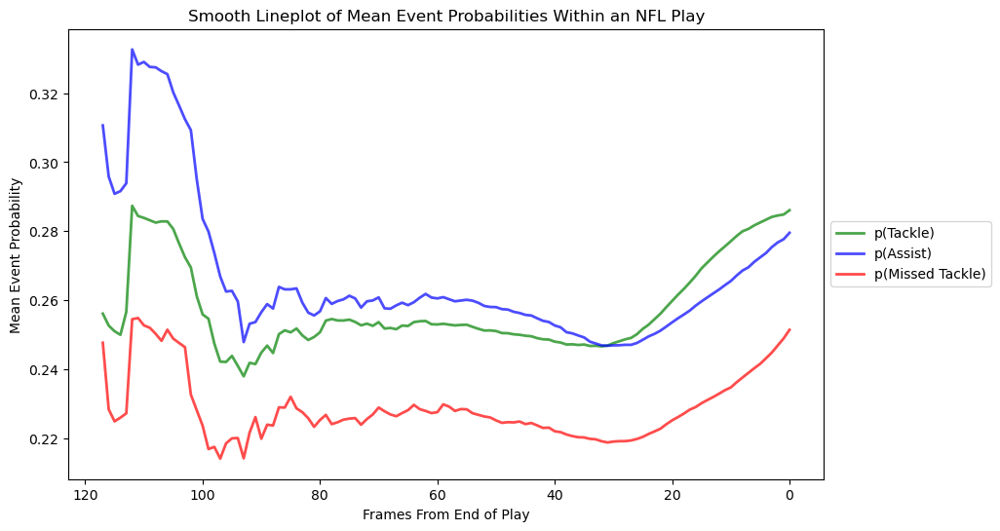

In [158]:
# mean frame-by-frame kdf (excluding fumbles)
mean_df = final_pred_df.copy()

mean_df = mean_df[mean_df['frames_from_end_of_play']>=0].reset_index().drop('index',axis=1)

mean_df = mean_df.drop(['nflId','club','playId','frame_id'],axis=1).groupby(['frames_from_end_of_play']).mean().reset_index()

mean_df = mean_df.sort_values(by='frames_from_end_of_play',ascending=False).reset_index().drop('index',axis=1)

# Create a smooth histogram
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot('frames_from_end_of_play', 'p(Tackle)', data=mean_df, marker='', color='green', linewidth=2, alpha=0.7)
plt.plot('frames_from_end_of_play', 'p(Assist)', data=mean_df, marker='', color='blue', linewidth=2, alpha=0.7)
plt.plot('frames_from_end_of_play', 'p(Missed Tackle)', data=mean_df, marker='', color='red', linewidth=2, alpha=0.7)
plt.gca().invert_xaxis()

# Set labels and title
plt.xlabel('Frames From End of Play')
plt.ylabel('Mean Event Probability')
plt.title('Smooth Lineplot of Mean Event Probabilities Within an NFL Play')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Show the plot
plt.show()

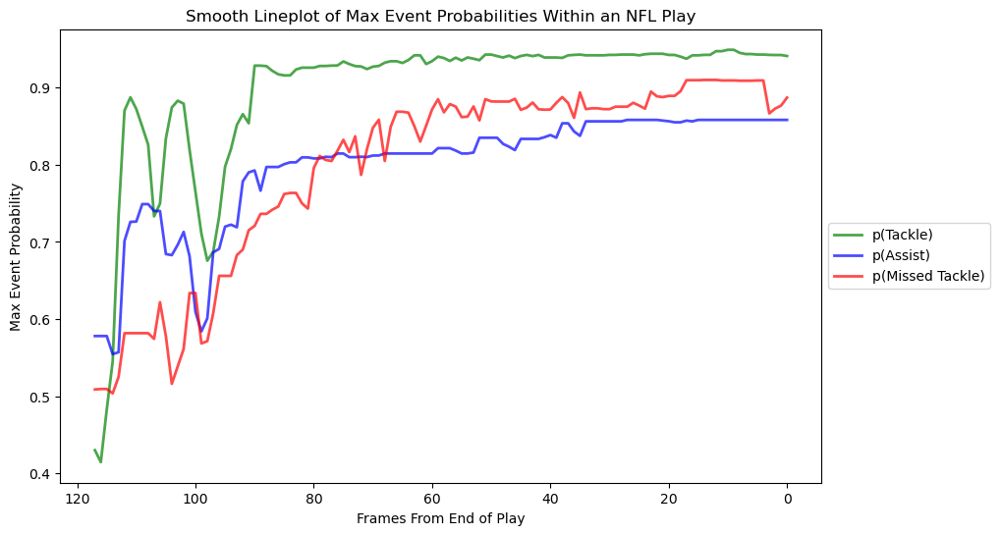

In [159]:
# max frame-by-frame kdf (excluding fumbles)

# mean frame-by-frame kdf (excluding fumbles)
max_df = final_pred_df.copy()

max_df = max_df[max_df['frames_from_end_of_play']>=0].reset_index().drop('index',axis=1)

max_df = max_df.drop(['nflId','club','playId','frame_id'],axis=1).groupby(['frames_from_end_of_play']).max().reset_index()

max_df = max_df.sort_values(by='frames_from_end_of_play',ascending=False).reset_index().drop('index',axis=1)

# Create a smooth histogram
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.plot('frames_from_end_of_play', 'p(Tackle)', data=max_df, marker='', color='green', linewidth=2, alpha=0.7)
plt.plot('frames_from_end_of_play', 'p(Assist)', data=max_df, marker='', color='blue', linewidth=2, alpha=0.7)
plt.plot('frames_from_end_of_play', 'p(Missed Tackle)', data=max_df, marker='', color='red', linewidth=2, alpha=0.7)
plt.gca().invert_xaxis()

# Set labels and title
plt.xlabel('Frames From End of Play')
plt.ylabel('Max Event Probability')
plt.title('Smooth Lineplot of Max Event Probabilities Within an NFL Play')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Show the plot
plt.show()

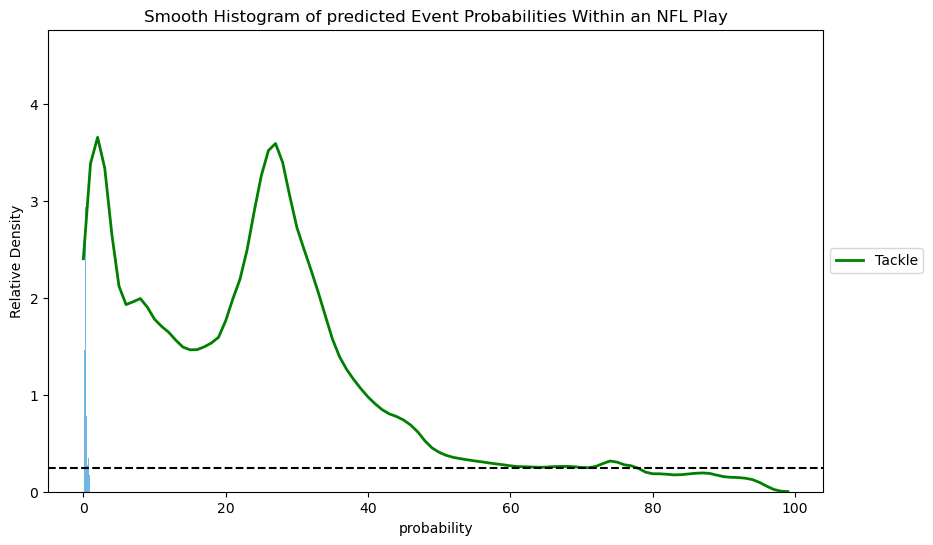

In [160]:
# Set the seaborn style for a nice appearance
# Extract the column data
p_tackle_values = final_pred_df['p(Tackle)']

# Set the bin size
bin_size = 0.01

# Create a smooth histogram
plt.figure(figsize=(10, 6))
plt.hist(p_tackle_values, bins=np.arange(p_tackle_values.min(), p_tackle_values.max() + bin_size, bin_size),
         density=True, color='#3498db', alpha=0.7)

# Plot kernel density estimate
from scipy.stats import gaussian_kde
kde = gaussian_kde(p_tackle_values)
x_vals = np.linspace(p_tackle_values.min(), p_tackle_values.max(), 100)
plt.plot(kde(x_vals), color='green', linewidth=2,label='Tackle')

# p_assist_values = final_pred_df['p(Assist)']
# kde = gaussian_kde(p_assist_values)
# x_vals = np.linspace(p_assist_values.min(), p_assist_values.max(), 100)
# plt.plot(kde(x_vals), color='blue', linewidth=2,label='Assist')

# p_m_tackle_values = final_pred_df['p(Missed Tackle)']
# kde = gaussian_kde(p_m_tackle_values)
# x_vals = np.linspace(p_m_tackle_values.min(), p_m_tackle_values.max(), 100)
# plt.plot(kde(x_vals), color='red', linewidth=2,label='Missed Tackle')

plt.axhline(y = 0.25, color = 'k', linestyle = '--') 

# Set labels and title
plt.xlabel('probability')
plt.ylabel('Relative Density')
plt.title('Smooth Histogram of predicted Event Probabilities Within an NFL Play')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Show the plot
plt.show()

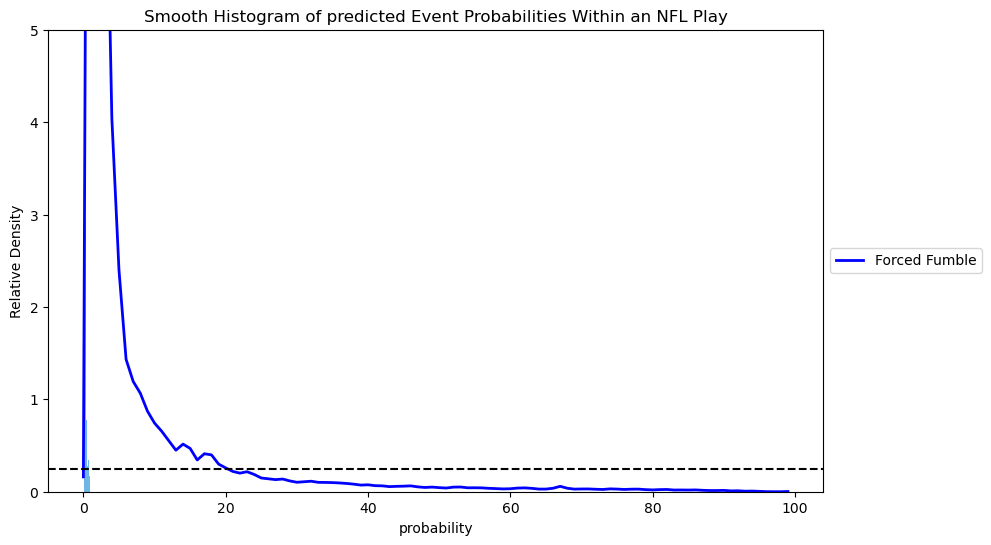

In [143]:
# Set the bin size
bin_size = 0.01

# Create a smooth histogram
plt.figure(figsize=(10, 6))
plt.hist(p_tackle_values, bins=np.arange(p_tackle_values.min(), p_tackle_values.max() + bin_size, bin_size),
         density=True, color='#3498db', alpha=0.7)

# Plot kernel density estimate
from scipy.stats import gaussian_kde

p_assist_values = final_pred_df['p(Forced Fumble)']
kde = gaussian_kde(p_assist_values)
x_vals = np.linspace(p_assist_values.min(), p_assist_values.max(), 100)
plt.plot(kde(x_vals), color='blue', linewidth=2,label='Forced Fumble')

plt.axhline(y = 0.25, color = 'k', linestyle = '--') 

# Set labels and title
plt.xlabel('probability')
plt.ylabel('Relative Density')
plt.ylim(0,5)
plt.title('Smooth Histogram of predicted Event Probabilities Within an NFL Play')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Show the plot
plt.show()

In [144]:
# In order to avoid over-stating pred_Tackles and other metrics, we must choose a threshold for which we decide
# to award a "pred_Tackle" on a play. Meaning if that probability is not eclipsed, the player was not "Supposed" to 
# record said statistic on that play. (Avoids a player w/ constant 0.05 probability from being awarded pred_Tackles=0.05*#_of_plays)

# THRESHOLDS:
_TACKLE_THRESHOLD = 0.8
_ASSIST_THRESHOLD = 0.8
_MISSED_TACKLE_THRESHOLD = 0.8
_FORCED_FUMBLE = 0.9

# NOTE: Fumble Forces Are So Rare That the relative density of probabilities between 0-5% is too great to effectively 
# show on the same plot as the others.

In [145]:
max_p_tackle_df = final_pred_df.groupby(['nflId', 'playId','club'])['p(Tackle)'].max().reset_index()
max_p_assist_df = final_pred_df.groupby(['nflId', 'playId','club'])['p(Assist)'].max().reset_index()
max_p_forced_fumble_df = final_pred_df.groupby(['nflId', 'playId','club'])['p(Forced Fumble)'].max().reset_index()
max_p_missed_tackle_df = final_pred_df.groupby(['nflId', 'playId','club'])['p(Missed Tackle)'].max().reset_index()

max_p_tackle_df['pred_Tackle'] = (max_p_tackle_df['p(Tackle)'] > _TACKLE_THRESHOLD).astype(int)
max_p_assist_df['pred_Assist'] = (max_p_assist_df['p(Assist)'] > _ASSIST_THRESHOLD).astype(int)
max_p_forced_fumble_df['pred_Forced_Fumble'] = (max_p_forced_fumble_df['p(Forced Fumble)'] > _FORCED_FUMBLE).astype(int)
max_p_missed_tackle_df['pred_Missed_Tackle'] = (max_p_missed_tackle_df['p(Missed Tackle)'] > _MISSED_TACKLE_THRESHOLD).astype(int)

p_tackle_df = max_p_tackle_df[['nflId','p(Tackle)','pred_Tackle']].groupby(['nflId']).sum().reset_index()
p_assist_df = max_p_assist_df[['nflId','p(Assist)','pred_Assist']].groupby(['nflId']).sum().reset_index()
p_forced_fumble_df = max_p_forced_fumble_df[['nflId','p(Forced Fumble)','pred_Forced_Fumble']].groupby(['nflId']).sum().reset_index()
p_missed_tackle_df = max_p_missed_tackle_df[['nflId','p(Missed Tackle)','pred_Missed_Tackle']].groupby(['nflId']).sum().reset_index()

def round_p_vals(df):
    for col in df.columns.tolist():
        if 'p(' in col:
            df[col] = round(df[col],0)
        
    return df

p_tackle_df = round_p_vals(p_tackle_df)
p_assist_df = round_p_vals(p_assist_df)
p_forced_fumble_df = round_p_vals(p_forced_fumble_df)
p_missed_tackle_df = round_p_vals(p_missed_tackle_df)

In [98]:
# DIFFERENCE BETWEEN SUM(p-vals) vs. THRESHOLD-Approach:

# Tackle:             pred_Tackle           >     p(Tackle)         by  ~  5      [THRESHOLD BETTER]
# Assist:             pred_Assist           <     p(Assist)         by  ~  9     [THRESHOLD BETTER]
# Missed Tackles:     pred_Missed_Tackle    >     p(Missed Tackle)  by  ~  5      [THRESHOLD BETTER]
# Forced Fumbles:     pred_Forced_Fumbles   >     p(Forced Fumble)  by  ~  8     [THRESHOLD BETTER]

In [146]:
# MERGING DATA W/ REALITY
tackle_sums = tackle_sums.merge(p_tackle_df,
                                how='left',
                                on=['nflId'])
tackle_sums = tackle_sums.drop(['p(Tackle)'],axis=1)

tackle_sums = tackle_sums.merge(p_assist_df,
                                how='left',
                                on=['nflId'])
tackle_sums = tackle_sums.drop(['p(Assist)'],axis=1)

tackle_sums = tackle_sums.merge(p_forced_fumble_df,
                                how='left',
                                on=['nflId'])
tackle_sums = tackle_sums.drop(['p(Forced Fumble)'],axis=1)

tackle_sums = tackle_sums.merge(p_missed_tackle_df,
                                how='left',
                                on=['nflId'])
tackle_sums = tackle_sums.drop(['p(Missed Tackle)'],axis=1)

tackle_sums

,displayName,nflId,position,tackle,assist,forcedFumble,pff_missedTackle,pred_Tackle,pred_Assist,pred_Forced_Fumble,pred_Missed_Tackle
0,Calais Campbell,33131,DE,8,10,0,4,4,2,0,0
1,Tyson Alualu,35449,NT,4,4,0,1,1,8,0,0
2,Brandon Graham,35452,DE,6,6,0,1,6,3,0,0
3,Jason Pierre-Paul,35454,DE,3,3,0,1,6,8,0,0
4,Kareem Jackson,35459,SS,28,23,0,9,61,11,2,14
5,Devin McCourty,35466,FS,36,9,0,3,49,15,1,2
6,Jerry Hughes,35470,DE,6,5,0,7,12,6,0,0
7,Carlos Dunlap,35493,OLB,8,5,0,1,9,11,0,0
8,Corey Peters,35522,DT,2,4,0,0,2,7,0,0
9,Al Woods,35562,NT,13,9,0,1,11,3,0,0


In [147]:
tackle_sums['tackle'] = tackle_sums['tackle'] + 0.5*tackle_sums['assist'] # Adjusting for Players who make combo-tackles more often

In [148]:
tackle_sums['TVOE'] = tackle_sums['tackle'] - tackle_sums['pred_Tackle']
tackle_sums['AVOE'] = tackle_sums['assist'] - tackle_sums['pred_Assist']
tackle_sums['FFVOE'] = tackle_sums['forcedFumble'] - tackle_sums['pred_Forced_Fumble']
tackle_sums['MTVOE'] = tackle_sums['pff_missedTackle'] - tackle_sums['pred_Missed_Tackle']

tm_df = final_pred_df[['nflId','club']].drop_duplicates(subset=['nflId','club'],keep='first').reset_index().drop('index',axis=1)

tackle_sums = tackle_sums.merge(tm_df,
                                how='left',
                                on='nflId')

tackle_sums

,displayName,nflId,position,tackle,assist,forcedFumble,pff_missedTackle,pred_Tackle,pred_Assist,pred_Forced_Fumble,pred_Missed_Tackle,TVOE,AVOE,FFVOE,MTVOE,club
0,Calais Campbell,33131,DE,13.0,10,0,4,4,2,0,0,9.0,8,0,4,BAL
1,Tyson Alualu,35449,NT,6.0,4,0,1,1,8,0,0,5.0,-4,0,1,PIT
2,Brandon Graham,35452,DE,9.0,6,0,1,6,3,0,0,3.0,3,0,1,PHI
3,Jason Pierre-Paul,35454,DE,4.5,3,0,1,6,8,0,0,-1.5,-5,0,1,BAL
4,Kareem Jackson,35459,SS,39.5,23,0,9,61,11,2,14,-21.5,12,-2,-5,DEN
5,Devin McCourty,35466,FS,40.5,9,0,3,49,15,1,2,-8.5,-6,-1,1,NE
6,Jerry Hughes,35470,DE,8.5,5,0,7,12,6,0,0,-3.5,-1,0,7,HOU
7,Carlos Dunlap,35493,OLB,10.5,5,0,1,9,11,0,0,1.5,-6,0,1,KC
8,Corey Peters,35522,DT,4.0,4,0,0,2,7,0,0,2.0,-3,0,0,JAX
9,Al Woods,35562,NT,17.5,9,0,1,11,3,0,0,6.5,6,0,1,SEA


In [149]:
# NOTE: To evaluate not only counting-stats but also efficiency-stats (i.e. Tackles & Pred_Tackles), I will use the euclidian
# distance between those two points and (0,0), scaled by the natural log of TVOE. This will incentivize high-usage,
# high-efficiency tacklers to be rated highest in this system, and not rank players w/ TVOE < 0 (by nature of ln(-x)=DNE)



# Assign weights to each column based on importance
weight_tvoe_positive = 0.7  # Adjust as needed
weight_tvoe_negative = 2.2  # Adjust as needed
weight_tackle = 0.3  # Adjust as needed
weight_pred_tackle = 0.3  # Adjust as needed

# Define a function to calculate 'Adj_TVOE'
def calculate_adj_tvoe(row):
    # Apply the weighted combination formula with different weights for positive and negative 'TVOE'
    adj_tvoe = np.clip(
        (weight_tvoe_positive * max(row['TVOE'], 0) + 
         weight_tvoe_negative * min(row['TVOE'], 0) + 
         weight_tackle * row['tackle'] + 
         weight_pred_tackle * row['pred_Tackle']),
        a_min=0, a_max=None
    )
    return adj_tvoe

# Create the new column 'Adj_TVOE'
tackle_sums['Adj_TVOE'] = tackle_sums.apply(calculate_adj_tvoe, axis=1)

tackle_sums

,displayName,nflId,position,tackle,assist,forcedFumble,pff_missedTackle,pred_Tackle,pred_Assist,pred_Forced_Fumble,pred_Missed_Tackle,TVOE,AVOE,FFVOE,MTVOE,club,Adj_TVOE
0,Calais Campbell,33131,DE,13.0,10,0,4,4,2,0,0,9.0,8,0,4,BAL,11.40
1,Tyson Alualu,35449,NT,6.0,4,0,1,1,8,0,0,5.0,-4,0,1,PIT,5.60
2,Brandon Graham,35452,DE,9.0,6,0,1,6,3,0,0,3.0,3,0,1,PHI,6.60
3,Jason Pierre-Paul,35454,DE,4.5,3,0,1,6,8,0,0,-1.5,-5,0,1,BAL,0.00
4,Kareem Jackson,35459,SS,39.5,23,0,9,61,11,2,14,-21.5,12,-2,-5,DEN,0.00
5,Devin McCourty,35466,FS,40.5,9,0,3,49,15,1,2,-8.5,-6,-1,1,NE,8.15
6,Jerry Hughes,35470,DE,8.5,5,0,7,12,6,0,0,-3.5,-1,0,7,HOU,0.00
7,Carlos Dunlap,35493,OLB,10.5,5,0,1,9,11,0,0,1.5,-6,0,1,KC,6.90
8,Corey Peters,35522,DT,4.0,4,0,0,2,7,0,0,2.0,-3,0,0,JAX,3.20
9,Al Woods,35562,NT,17.5,9,0,1,11,3,0,0,6.5,6,0,1,SEA,13.10


In [150]:
tackle_sums['Adj_TVOE'] = tackle_sums['Adj_TVOE'].replace(-np.inf, 0)

from scipy.stats import zscore
tackle_sums['Adj_TVOE'] = zscore(tackle_sums['Adj_TVOE'])

tackle_sums.sort_values(by='Adj_TVOE',ascending=False)

,displayName,nflId,position,tackle,assist,forcedFumble,pff_missedTackle,pred_Tackle,pred_Assist,pred_Forced_Fumble,pred_Missed_Tackle,TVOE,AVOE,FFVOE,MTVOE,club,Adj_TVOE
498,Jordyn Brooks,52435,ILB,72.5,23,1,10,74,40,0,1,-1.5,-17,1,9,SEA,5.258453
110,Jordan Hicks,42427,ILB,64.0,20,0,5,60,29,0,0,4.0,-9,0,5,MIN,5.162724
624,Divine Deablo,53509,OLB,56.0,34,0,7,47,33,4,4,9.0,1,-4,3,LV,4.750354
478,T.J. Edwards,48516,ILB,61.5,25,0,8,62,40,0,1,-0.5,-15,0,7,PHI,4.566260
445,Cole Holcomb,47956,ILB,54.0,32,0,4,50,32,0,4,4.0,0,0,0,WAS,4.279073
30,Bobby Wagner,38577,ILB,51.5,23,0,1,45,36,0,1,6.5,-13,0,0,LA,4.205436
591,Zaven Collins,53445,OLB,51.0,24,1,13,45,26,0,1,6.0,-2,1,12,ARI,4.131798
613,Pete Werner,53489,OLB,62.0,22,2,8,65,28,0,1,-3.0,-6,2,7,NO,3.910885
169,De'Vondre Campbell,43404,ILB,50.0,26,0,9,48,32,0,1,2.0,-6,0,8,GB,3.807793
248,Grover Stewart,44957,DT,38.0,14,0,3,21,33,0,0,17.0,-19,0,3,IND,3.631063


In [151]:
# Cleveland Brown's 2022 Week 1-9 Tackling Value
cle_df = tackle_sums[tackle_sums['club']=='CLE'][['displayName','club','position','nflId','tackle','pred_Tackle','TVOE','Adj_TVOE']].sort_values(by='Adj_TVOE',ascending=False)

cle_df.to_csv('../data/processed/Output Datasets/cleveland_browns.csv')

cle_df

,displayName,club,position,nflId,tackle,pred_Tackle,TVOE,Adj_TVOE
610,Jeremiah Owusu-Koramoah,CLE,OLB,53481,33.0,34,-1.0,1.907943
415,Sione Takitaki,CLE,OLB,47863,25.5,24,1.5,1.613393
529,Jacob Phillips,CLE,MLB,52505,35.0,38,-3.0,1.525028
261,Isaac Rochell,CLE,DE,45038,12.5,5,7.5,0.818107
721,Alex Wright,CLE,DE,54543,12.5,7,5.5,0.700287
526,Jordan Elliott,CLE,DT,52496,10.0,4,6.0,0.508829
200,Myles Garrett,CLE,DE,44813,8.0,0,8.0,0.449919
287,Taven Bryan,CLE,DT,46098,8.0,7,1.0,0.037549
154,Deion Jones,CLE,ILB,43341,7.5,7,0.5,-0.036089
771,Isaiah Thomas,CLE,DE,54688,4.0,1,3.0,-0.198091


In [152]:
# Tm AdjTVOE Roll-Up
tm_df = tackle_sums.groupby(['club']).sum()
tm_df = tm_df.drop(['displayName','nflId','position'],axis=1).reset_index()
tm_df = tm_df[['club','tackle','pred_Tackle','TVOE','Adj_TVOE']].sort_values(by='Adj_TVOE',ascending=False).reset_index().drop('index',axis=1)

tm_df.to_csv('../data/processed/Output Datasets/team_rankings.csv')

tm_df

,club,tackle,pred_Tackle,TVOE,Adj_TVOE
0,GB,396.0,380,16.0,11.717071
1,NE,394.0,356,38.0,11.188340
2,TB,413.0,455,-42.0,7.645643
3,SEA,436.5,484,-47.5,6.910727
4,LV,404.5,434,-29.5,6.336354
5,LAC,368.0,411,-43.0,4.920322
6,CIN,405.5,451,-45.5,4.613235
7,LA,368.5,400,-31.5,4.052129
8,PIT,387.0,421,-34.0,4.038861
9,IND,426.0,477,-51.0,3.852578


In [153]:
# Defensive Front AdjTVOE Roll-Up
df_pos_list = ['DE','NT','DT']

for idx,row in tackle_sums.iterrows():
    if row['position'] in df_pos_list:
        tackle_sums.at[idx,'KEEP']=True
    else:
        tackle_sums.at[idx,'KEEP']=False

df_tackle_sums = tackle_sums[tackle_sums['KEEP']==True].reset_index().drop(['index','KEEP'],axis=1)
df_tackle_sums = df_tackle_sums[['displayName','club','position','nflId','tackle','pred_Tackle','TVOE','Adj_TVOE']].sort_values(by='Adj_TVOE',ascending=False).reset_index().drop('index',axis=1).head(10)

df_tackle_sums.to_csv('../data/processed/Output Datasets/defensive_front_rankings.csv')

df_tackle_sums

,displayName,club,position,nflId,tackle,pred_Tackle,TVOE,Adj_TVOE
0,Grover Stewart,IND,DT,44957,38.0,21,17.0,3.631063
1,Derrick Brown,CAR,DE,52415,31.0,10,21.0,3.248147
2,Maxx Crosby,LV,DE,47889,33.0,22,11.0,2.835777
3,Christian Wilkins,MIA,DT,47796,31.5,20,11.5,2.732684
4,A'Shawn Robinson,LA,DT,43335,25.0,8,17.0,2.482316
5,Cameron Jordan,NO,DE,37097,24.5,7,17.5,2.467589
6,Zach Allen,ARI,DE,47848,23.0,5,18.0,2.364496
7,Sam Hubbard,CIN,DE,46146,26.5,15,11.5,2.290859
8,Davon Godchaux,NE,NT,44991,21.0,4,17.0,2.128856
9,Davon Hamilton,JAX,DT,52481,23.5,11,12.5,2.084673


In [154]:
# Defensive Backers AdjTVOE Roll-Up
lb_pos_list = ['ILB','MLB','OLB']

for idx,row in tackle_sums.iterrows():
    if row['position'] in lb_pos_list:
        tackle_sums.at[idx,'KEEP']=True
    else:
        tackle_sums.at[idx,'KEEP']=False

lb_tackle_sums = tackle_sums[tackle_sums['KEEP']==True].reset_index().drop(['index','KEEP'],axis=1)
lb_tackle_sums = lb_tackle_sums[['displayName','club','position','nflId','tackle','pred_Tackle','TVOE','Adj_TVOE']].sort_values(by='Adj_TVOE',ascending=False).reset_index().drop('index',axis=1).head(10)

lb_tackle_sums.to_csv('../data/processed/Output Datasets/linebackers_rankings.csv')

lb_tackle_sums

,displayName,club,position,nflId,tackle,pred_Tackle,TVOE,Adj_TVOE
0,Jordyn Brooks,SEA,ILB,52435,72.5,74,-1.5,5.258453
1,Jordan Hicks,MIN,ILB,42427,64.0,60,4.0,5.162724
2,Divine Deablo,LV,OLB,53509,56.0,47,9.0,4.750354
3,T.J. Edwards,PHI,ILB,48516,61.5,62,-0.5,4.566260
4,Cole Holcomb,WAS,ILB,47956,54.0,50,4.0,4.279073
5,Bobby Wagner,LA,ILB,38577,51.5,45,6.5,4.205436
6,Zaven Collins,ARI,OLB,53445,51.0,45,6.0,4.131798
7,Pete Werner,NO,OLB,53489,62.0,65,-3.0,3.910885
8,De'Vondre Campbell,GB,ILB,43404,50.0,48,2.0,3.807793
9,Drue Tranquill,LAC,ILB,47913,53.0,55,-2.0,3.395422


In [155]:
# Defensive Backs AdjTVOE Roll-Up
db_pos_list = ['SS','FS','DB','CB']

for idx,row in tackle_sums.iterrows():
    if row['position'] in db_pos_list:
        tackle_sums.at[idx,'KEEP']=True
    else:
        tackle_sums.at[idx,'KEEP']=False

db_tackle_sums = tackle_sums[tackle_sums['KEEP']==True].reset_index().drop(['index','KEEP'],axis=1)
db_tackle_sums = db_tackle_sums[['displayName','club','position','nflId','tackle','pred_Tackle','TVOE','Adj_TVOE']].sort_values(by='Adj_TVOE',ascending=False).reset_index().drop('index',axis=1).head(10)

db_tackle_sums.to_csv('../data/processed/Output Datasets/defensive_backs_rankings.csv')

db_tackle_sums

,displayName,club,position,nflId,tackle,pred_Tackle,TVOE,Adj_TVOE
0,Jonathan Owens,HOU,FS,46669,54.5,60,-5.5,2.548590
1,Marcus Epps,PHI,SS,47974,38.5,39,-0.5,2.533863
2,Damar Hamlin,BUF,SS,53641,44.0,47,-3.0,2.320314
3,Lamarcus Joyner,NYJ,SS,41270,25.0,11,14.0,2.305586
4,Kamren Curl,WAS,SS,52624,38.5,40,-1.5,2.254040
5,Donovan Wilson,DAL,SS,47996,47.5,52,-4.5,2.209857
6,Keanu Neal,TB,FS,43306,30.5,27,3.5,2.173039
7,Coby Bryant,SEA,CB,54574,33.0,34,-1.0,1.907943
8,Jack Jones,NE,CB,54586,21.5,9,12.5,1.907943
9,Charvarius Ward,SF,CB,46757,29.5,29,0.5,1.907943
